
***

## Bankruptcy Prediction  

Given *financial client data*, let's try to predict whether a given client will go **bankrupt** or not.

We will use a variety of classification models to make our predictions.

# Data Understanding

In [16]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier

from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings(action='ignore')

In [24]:
data = pd.read_csv('data.csv')

In [25]:
data

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256969e-04,0.000000e+00,0.458143,7.250725e-04,0.000000,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820926e-04,1.165007e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,2.559237e-02,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897851e-04,0.000000e+00,0.461867,6.470647e-04,0.000000,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9

In [27]:
{column : len(data[column].unique()) for column in data.columns}

{'Bankrupt?': 2,
 ' ROA(C) before interest and depreciation before interest': 3333,
 ' ROA(A) before interest and % after tax': 3151,
 ' ROA(B) before interest and depreciation after tax': 3160,
 ' Operating Gross Margin': 3781,
 ' Realized Sales Gross Margin': 3788,
 ' Operating Profit Rate': 3376,
 ' Pre-tax net Interest Rate': 3789,
 ' After-tax net Interest Rate': 3604,
 ' Non-industry income and expenditure/revenue': 2551,
 ' Continuous interest rate (after tax)': 3617,
 ' Operating Expense Rate': 2966,
 ' Research and development expense rate': 1536,
 ' Cash flow rate': 5557,
 ' Interest-bearing debt interest rate': 1080,
 ' Tax rate (A)': 2488,
 ' Net Value Per Share (B)': 2278,
 ' Net Value Per Share (A)': 2285,
 ' Net Value Per Share (C)': 2284,
 ' Persistent EPS in the Last Four Seasons': 1358,
 ' Cash Flow Per Share': 1545,
 ' Revenue Per Share (Yuan ¥)': 3807,
 ' Operating Profit Per Share (Yuan ¥)': 1236,
 ' Per Share Net profit before tax (Yuan ¥)': 1522,
 ' Realized Sale

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

# Exploratory Data Analysis

In [57]:
#import required ploting libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Text(0.5, 1.0, 'Target feature - Bankrupt?')

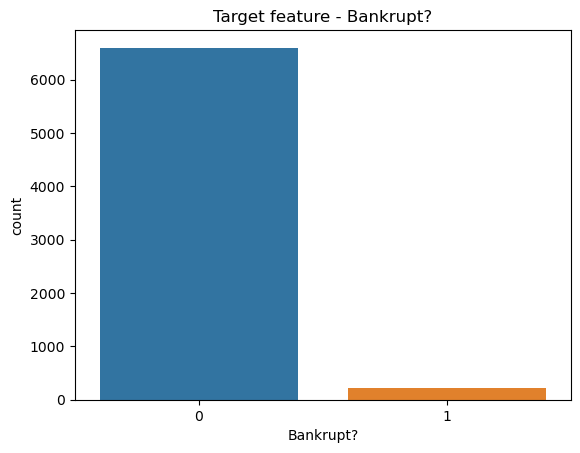

In [54]:
sns.countplot(x=data['Bankrupt?'])
plt.title('Target feature - Bankrupt?')

In [55]:
data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.11

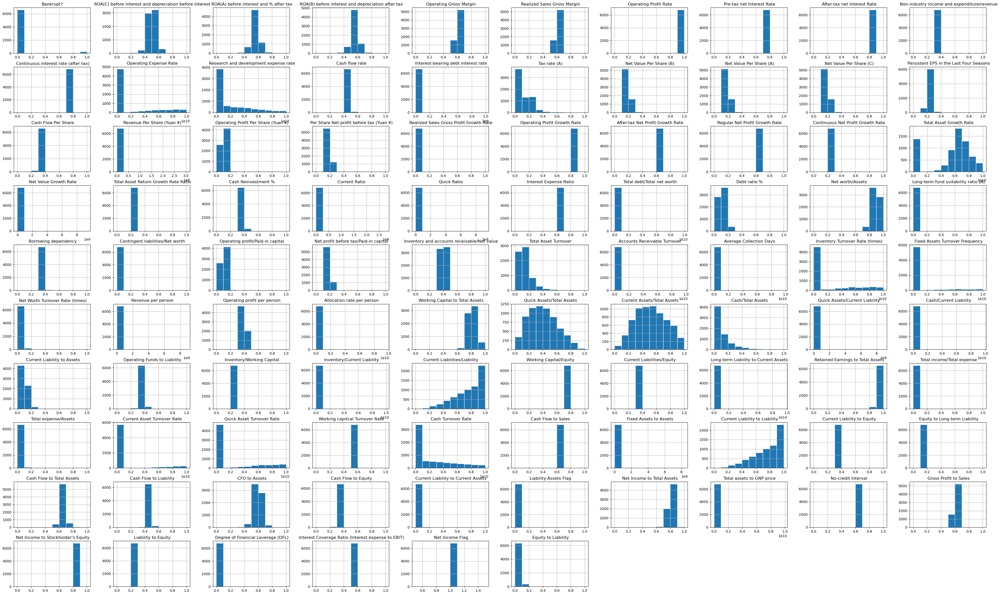

In [59]:
import matplotlib.pyplot as plt

# Create a histogram for the DataFrame 'data'
data.hist(figsize=(50, 30), edgecolor='white')

# Display the histogram
plt.show()

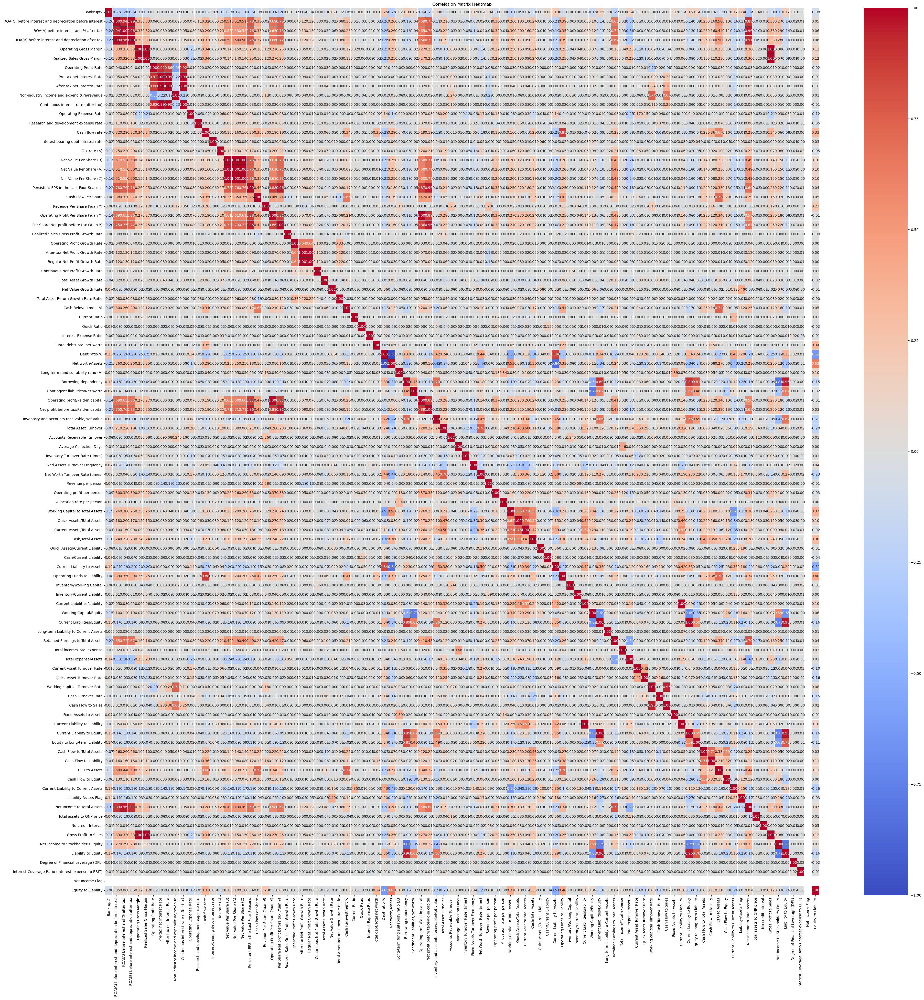

In [60]:
# Calculate the correlation coefficients
correlation_matrix = data.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(45, 45))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap')
plt.show()

## Selecting variables with a correlation above a given threshold threshold

In [61]:
# Calculate the correlation coefficients
correlation_matrix = data.corr()

# Select the correlation between "Bankrupt?" and all other variables
bankrupt_correlation = correlation_matrix['Bankrupt?'].drop('Bankrupt?')

# Set a correlation threshold (absolute value) to select variables
correlation_threshold = 0.2

# Select variables with correlation above the threshold
selected_variables = bankrupt_correlation[abs(bankrupt_correlation) > correlation_threshold]

# Print the selected variables and their correlation coefficients
print(selected_variables)

 ROA(C) before interest and depreciation before interest   -0.260807
 ROA(A) before interest and % after tax                    -0.282941
 ROA(B) before interest and depreciation after tax         -0.273051
 Persistent EPS in the Last Four Seasons                   -0.219560
 Per Share Net profit before tax (Yuan ¥)                  -0.201395
 Debt ratio %                                               0.250161
 Net worth/Assets                                          -0.250161
 Net profit before tax/Paid-in capital                     -0.207857
 Retained Earnings to Total Assets                         -0.217779
 Net Income to Total Assets                                -0.315457
Name: Bankrupt?, dtype: float64


## Visualising the correlation matrix where the Correlation exceeds a given threshold

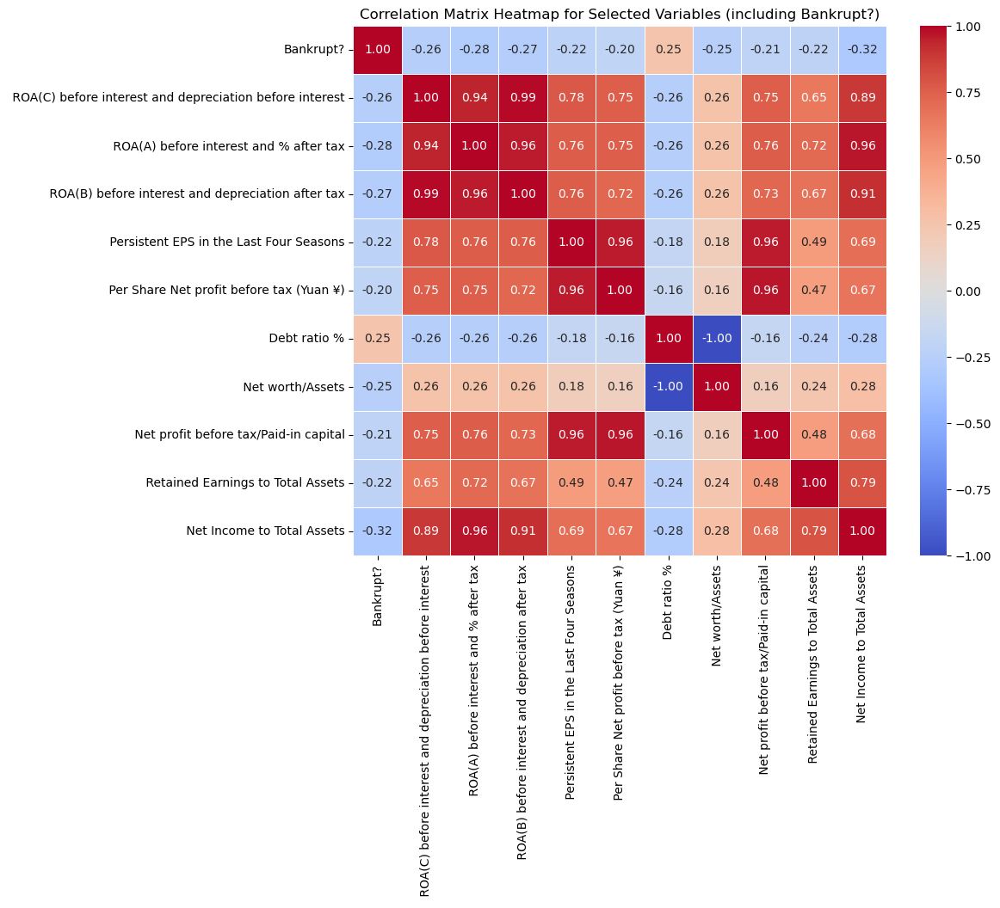

In [63]:
# Calculate the correlation coefficients with 'Bankrupt?'
correlation_matrix = data.corr()

# Select variables with highest absolute correlation with 'Bankrupt?' above a threshold (e.g., 0.2)
correlation_threshold = 0.2
selected_variables = correlation_matrix['Bankrupt?'][abs(correlation_matrix['Bankrupt?']) > correlation_threshold].index

# Create a correlation matrix for the selected variables including 'Bankrupt?'
selected_correlation_matrix = data[selected_variables].corr()

# Create a heatmap for the selected correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(selected_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix Heatmap for Selected Variables (including Bankrupt?)')
plt.show()


## Visualizing the Effect of ROA on Bankruptcy using scatterplots

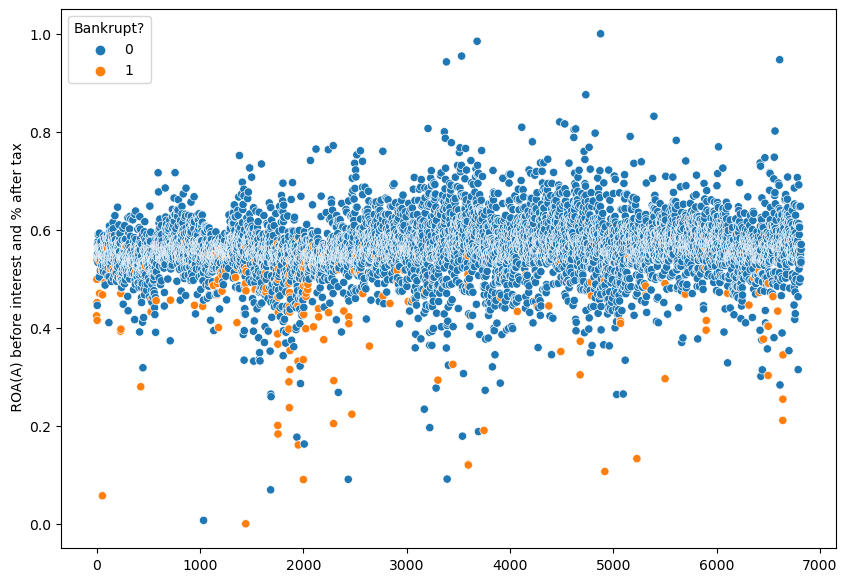

In [64]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot
fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = data.index ,y = ' ROA(A) before interest and % after tax', hue = 'Bankrupt?', data = data)
plt.show()

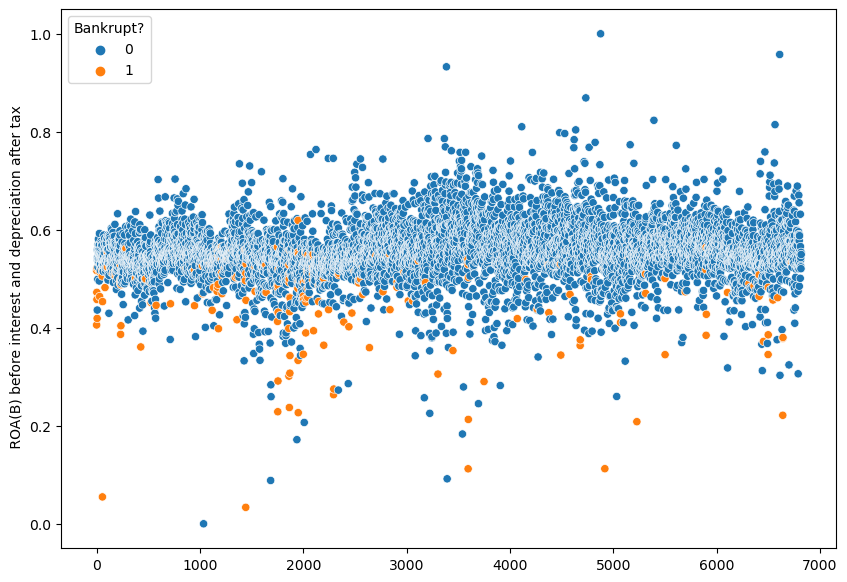

In [65]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot
fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = data.index ,y = ' ROA(B) before interest and depreciation after tax', hue = 'Bankrupt?', data = data)
plt.show()

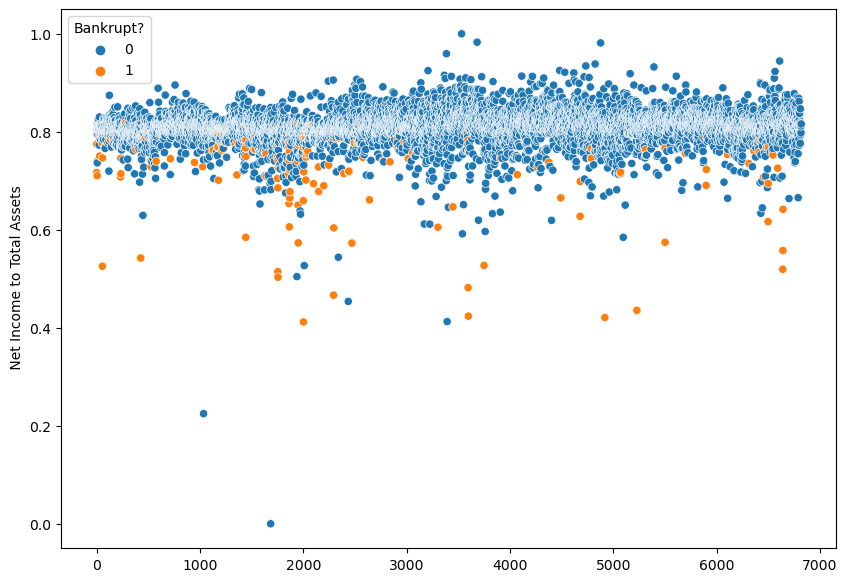

In [66]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot
fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = data.index ,y = ' Net Income to Total Assets', hue = 'Bankrupt?', data = data)
plt.show()

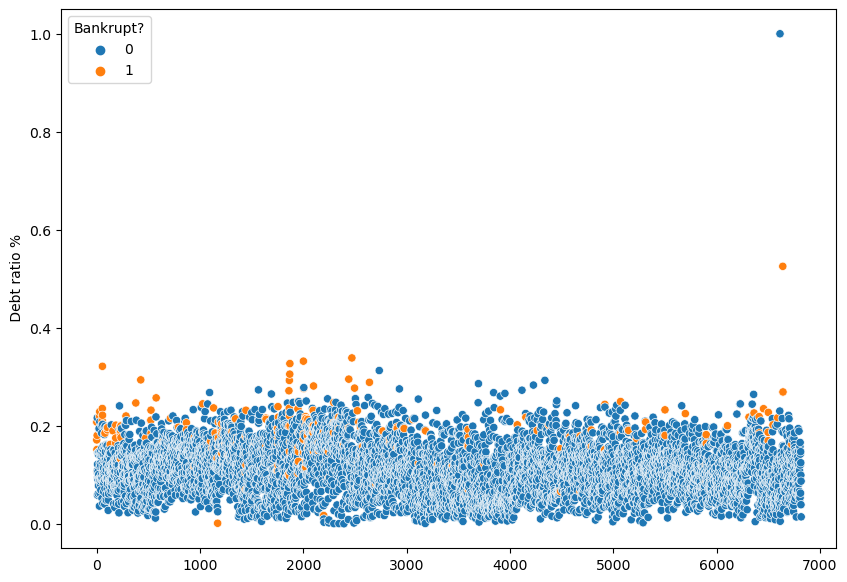

In [67]:
#plotting all the ROA(A) before interest and %after tax samples as scatter plot
fig = plt.figure(figsize = (10,7))
sns.scatterplot(x = data.index ,y = ' Debt ratio %', hue = 'Bankrupt?', data = data)
plt.show()

## Setting up the pandas dataframe for selected variables

In [68]:
# Create the new DataFrame 'financial_data' with the selected columns
financial_data = data[
    [' ROA(C) before interest and depreciation before interest',
     ' ROA(A) before interest and % after tax',
     ' ROA(B) before interest and depreciation after tax',
     ' Persistent EPS in the Last Four Seasons',
     ' Per Share Net profit before tax (Yuan ¥)',
     ' Debt ratio %',
     ' Net worth/Assets',
     ' Net profit before tax/Paid-in capital',
     ' Retained Earnings to Total Assets',
     ' Net Income to Total Assets']
].copy()

# Print the first few rows of the new DataFrame to verify the data
financial_data.head(20)

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Persistent EPS in the Last Four Seasons,Per Share Net profit before tax (Yuan ¥),Debt ratio %,Net worth/Assets,Net profit before tax/Paid-in capital,Retained Earnings to Total Assets,Net Income to Total Assets
0,0.370594,0.424389,0.405750,0.169141,0.138736,0.207576,0.792424,0.137757,0.903225,0.716845
1,0.464291,0.538214,0.516730,0.208944,0.169918,0.171176,0.828824,0.168962,0.931065,0.795297
2,0.426071,0.499019,0.472295,0.180581,0.142803,0.207516,0.792484,0.148036,0.909903,0.774670
3,0.399844,0.451265,0.457733,0.193722,0.148603,0.151465,0.848535,0.147561,0.906902,0.739555
4,0.465022,0.538432,0.522298,0.212537,0.168412,0.106509,0.893491,0.167461,0.913850,0.795016
5,0.388680,0.415177,0.419134,0.174435,0.138811,0.180427,0.819573,0.137825,0.903041,0.710420
6,0.390923,0.445704,0.436158,0.161482,0.128945,0.216102,0.783898,0.127939,0.911441,0.736619
7,0.508361,0.570922,0.559077,0.225206,0.180462,0.108202,0.891798,0.179519,0.935449,0.815350
8,0.488519,0.545137,0.543284,0.218398,0.173157,0.058591,0.941409,0.172159,0.935200,0.803647
9,0.495686,0.550916,0.542963,0.217831,0.176621,0.121293,0.878707,0.175658,0.938290,0.804195


## Creating a Barplot from Seaborn for Accounting ratios with Highest Absolute Correlation

The Code Below calculates the correlation coefficients between each variable in the DataFrame data and the "Bankrupt?" variable.

It selects the correlation coefficients that have an absolute value greater than 0.2 with respect to the "Bankrupt?" variable. These selected variables are stored in the selected_variables Series.

The code then creates a new DataFrame named selected_data containing only the selected variables and the "Bankrupt?" column.

The DataFrame selected_data is then "melted" into a long format, where the "Variable" column contains the variable names, and the "Value" column contains the corresponding accounting magnitude values. This is done to prepare the data for creating the bar plots.

The code uses the seaborn library to create a series of bar plots. Each plot represents one of the selected variables. The x-axis of each plot shows the variable names, and the y-axis shows the accounting magnitudes. The bars in each plot are colored differently to represent bankrupt (0) and not bankrupt (1) firms.

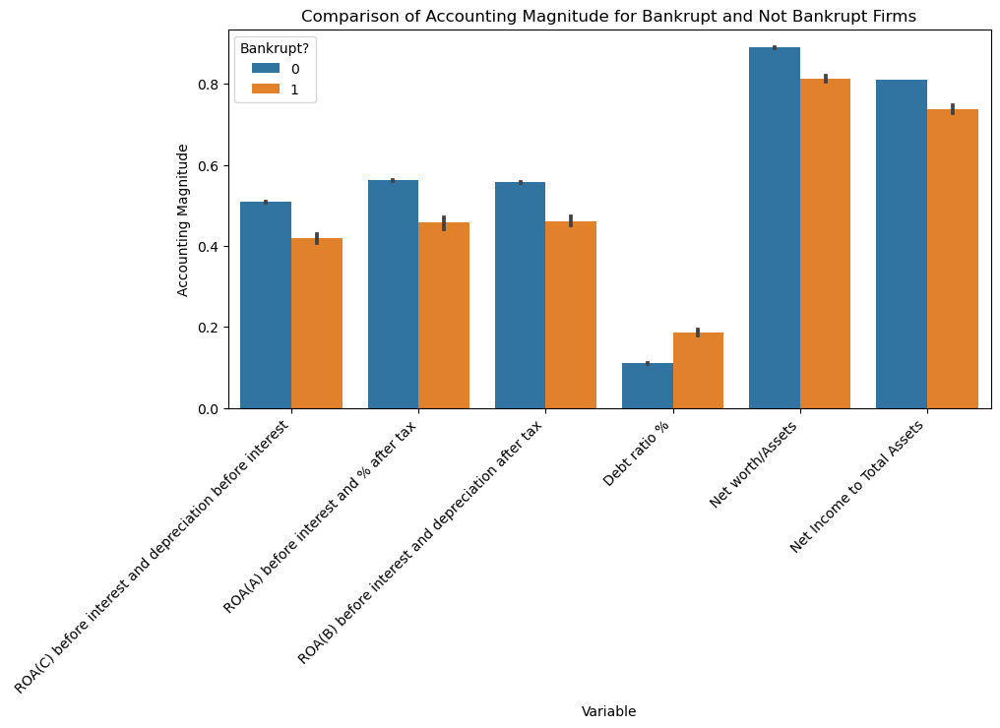

In [69]:
# Calculate the correlation coefficients
correlation_matrix = data.corr()

# Select the correlation between "Bankrupt?" and all other variables
bankrupt_correlation = correlation_matrix['Bankrupt?'].drop('Bankrupt?')

# Set a correlation threshold (absolute value) to select variables
correlation_threshold = 0.25

# Select variables with correlation above the threshold
selected_variables = bankrupt_correlation[abs(bankrupt_correlation) > correlation_threshold]

# Create a DataFrame containing only the selected variables and "Bankrupt?" column
selected_data = data[list(selected_variables.index) + ['Bankrupt?']]

# Melt the DataFrame to prepare for the bar plots
selected_data_melted = selected_data.melt(id_vars='Bankrupt?', var_name='Variable', value_name='Value')

# Plot the bar plots using seaborn
plt.figure(figsize=(10, 5))
sns.barplot(x='Variable', y='Value', hue='Bankrupt?', data=selected_data_melted)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Variable')
plt.ylabel('Accounting Magnitude')
plt.title('Comparison of Accounting Magnitude for Bankrupt and Not Bankrupt Firms')
plt.show()

## Interpretation of Seaborn Barplot

The series of bar plots visually compares the accounting magnitudes for each of the selected variables between two groups: bankrupt firms (represented by the color 0) and firms that are not bankrupt (represented by the color 1). By examining the bars for each variable, we can observe how the accounting magnitude differs between bankrupt and non-bankrupt firms for the selected variables. If the bars for a particular variable show a significant difference between the two groups, it may suggest that the variable is important in distinguishing bankrupt and non-bankrupt firms based on their accounting metrics.

Overall, this visualization provides valuable insights into the relationship between the selected accounting variables and the likelihood of bankruptcy for the analyzed firms

# Preprocessing

In [30]:
# Removing the column that has single value in its column because that won't contribute to our model analysis for PCA. 
def preprocess_inputs(df):
    df = df.copy()
    
    # Drop single-value column
    df = df.drop(' Net Income Flag', axis=1)
    
    # Split df into X and y
    y = df['Bankrupt?']
    X = df.drop('Bankrupt?', axis=1)
    
    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, shuffle=True, random_state=1)
    
    # Scale X
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)
    
    return X_train, X_test, y_train, y_test

In [31]:
X_train, X_test, y_train, y_test = preprocess_inputs(data)

In [32]:
X_train

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
3392,-7.065972,-7.189713,-7.577832,-0.353178,-0.352216,-27.422519,-9.852867,-9.473508,0.174600,-17.488805,-0.623336,-0.750627,-3.409234,-0.146024,-0.831378,-1.684936,-1.679626,-1.680602,-2.210939,-1.269358,-0.023643,-2.383154,-1.803000,-0.072283,-0.149416,-0.092698,-0.093621,-0.017514,-1.071132,-0.123720,-0.358472,-6.762465,-0.014476,-0.029836,-0.031652,-0.025154,-0.245936,0.245936,-0.118704,-0.292121,-0.045435,-2.398334,-1.930971,-0.554824,-1.366000,-0.04243,-0.038594,0.886224,0.736406,-0.842540,-0.020349,-0.918259,-0.039086,0.776376,1.652612,0.989620,-0.369080,-0.014476,-0.074892,0.334264,-4.717374,-0.033918,-0.090308,1.161424,0.227750,-0.066147,-0.092181,-6.779749,-0.045371,8.415101,-0.423261,-0.643034,0.806322,-0.842942,-1.475297,-0.161486,1.161424,-0.066147,-0.219187,-5.838952,-2.424303,-8.876742,-3.764293,-0.301941,-0.032383,-9.998552,4.692638,-0.014135,-0.353225,-1.832779,-0.140534,-0.046856,-0.002980,-0.193823
2755,0.405365,0.354931,0.313557,0.203699,0.200630,0.105921,0.077435,0.062927,0.047214,0.099756,-0.623336,1.316196,0.168498,-0.146024,0.987475,-0.101405,-0.100452,-0.101962,0.111816,0.190816,-0.023643,-0.097101,0.136276,-0.080535,-0.032348,0.008982,0.007273,-0.008501,0.377593,-0.034893,-0.058556,0.354458,-0.014476,-0.029836,-0.006998,-0.025154,-0.432271,0.432271,-0.119722,-0.156458,-0.017916,-0.092838,0.172557,-0.268783,-0.3

In [33]:
y_train

3392    0
2755    0
4442    0
4267    0
4912    0
       ..
905     0
5192    0
3980    0
235     1
5157    0
Name: Bankrupt?, Length: 4773, dtype: int64

# Training (Original Data)

In [34]:
original_models = {
    "                   Logistic Regression": LogisticRegression(),
    "                         Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine (Linear Kernel)": LinearSVC(),
    "   Support Vector Machine (RBF Kernel)": SVC(),
    "                         Random Forest": RandomForestClassifier(),
}

for name, model in original_models.items():
    model.fit(X_train, y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                         Decision Tree trained.
Support Vector Machine (Linear Kernel) trained.
   Support Vector Machine (RBF Kernel) trained.
                         Random Forest trained.


In [35]:
original_results = []

for name, model in original_models.items():
    result = model.score(X_test, y_test)
    original_results.append(result)
    print(name + ": {:.2f}%".format(result * 100))

                   Logistic Regression: 96.43%
                         Decision Tree: 95.31%
Support Vector Machine (Linear Kernel): 96.14%
   Support Vector Machine (RBF Kernel): 96.58%
                         Random Forest: 96.33%


# Feature Engineering & Dimensionality Reduction (PCA)

In [42]:
n_components = 94

pca = PCA(n_components=n_components)
pca.fit(X_train)

X_train_reduced = pd.DataFrame(pca.transform(X_train), index=X_train.index, columns=["PC" + str(i) for i in range(1, n_components + 1)])
X_test_reduced = pd.DataFrame(pca.transform(X_test), index=X_test.index, columns=["PC" + str(i) for i in range(1, n_components + 1)])

In [43]:
X_train_reduced

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50,PC51,PC52,PC53,PC54,PC55,PC56,PC57,PC58,PC59,PC60,PC61,PC62,PC63,PC64,PC65,PC66,PC67,PC68,PC69,PC70,PC71,PC72,PC73,PC74,PC75,PC76,PC77,PC78,PC79,PC80,PC81,PC82,PC83,PC84,PC85,PC86,PC87,PC88,PC89,PC90,PC91,PC92,PC93,PC94
3392,21.396971,-7.427836,-10.384790,16.385044,8.410605,14.815803,-1.072838,0.033075,2.402385,-2.696531,-4.214135,6.352764,-11.027381,1.913793,1.606729,1.729124,0.570398,-0.789446,-0.892282,-0.320629,-1.797002,-2.299265,0.158909,-2.584296,-2.901013,1.291582,0.719369,0.071927,-1.077647,1.268982,0.234510,-1.286139,-2.170726,0.026729,0.659986,1.623508,-0.299143,-1.253455,0.089233,1.378367,-3.465337,-0.325044,-5.566624,-0.114496,-2.370308,-1.374702,0.387789,0.008084,-0.623874,2.009423,1.666888,-6.253381,-5.552162,-5.670375,13.485811,5.164796,2.414657,0.248695,5.763678,1.951909,-0.096881,-1.057261,2.146485,-1.081045,7.166036,1.682672,0.923173,1.780433,-1.115230,-0.843055,-0.433020,1.470648,-0.138616,-0.440672,-1.108144,0.010372,0.930639,-0.632512,-0.124990,-0.251547,-1.437326,0.054612,0.302335,-0.058173,-0.031229,0.057488,0.262348,0.005251,1.425501e-05,8.958819e-06,-7.364332e-10,-1.080497e-14,-5.192452e-15,7.542372e-16
2755,-0.537250,-0.632416,1.522062,0.059505,-0.892918,0.115449,0.166554,-0.332114,-0.642663,-0.422476,0.569907,-0.704901,0.165873,-0.239947,0.391633,0.419027,-0.332370,-0.234684,0.223903,0.538678,-1.338388,0.872265,1.142810,0.173128,-0.165659,0.182387,-0.318347,-0.268019,-0.151064,0.371043,-0.610176,0.540534,-0.316358,0.052687,-0.047715,0.225196,-1.077294,0.739121,-0.639626,-0.100860,0.721593,-1.240560,-0.501506,0.063968,0.379138,-0.043415,-0.135799,-0.568019,0.136798,-0.411147,0.113967,-0.007154,0.158042,0.227862,0.527669,-0.189042,0.114654,0.013197,-0.045299,-0.071416,-0.107512,0.158320,-0.154621,-0.242867,0.027840,-0.131080,0.127882,0.022143,0.056348,0.011610,-0.015061,0.001409,-0.010412,0.032839,-0.003984,-0.028037,-0.017289,0.021823,0.001008,0.013471,0.007356,-0.012186,-0.001268,0.001103,0.000554,-0.000496,0.001396,0.000096,-7.010621e-06,-3.457161e-05,-8.154464e-11,-8.258081e-16,7.081428e-17,3.124201e-16
4442,-3.777733,-0.482875,1.127331,0.334114,1.277027,0.359205,0.872919,-0.504780,-1.627089,-1.011487,1.137812,-0.990688,0.020866,0.753910,0.551596,-0.209501,0.195654,0.323243,-0.338553,0.361258,-0.945430,0.968478,0.652160,0.036588,0.389052,0.179218,0.169331,-0.071738,0.091093,-0.075175,-0.328946,0.002957,0.206092,0.648976,-0.053190,-0.402783,0.213547,0.060351,0.461387,-0.270898,-0.165188,1.563078,0.335242,0.200471,-0.000799,-0.080850,0.157284,-0.297051,0.606349,-0.728476,0.456325,-0.393636,0.184266,-0.454713,0.214520,0.235545,-0.154430,-0.207144,-0.302312,-0.311534,0.309213,-0.333500,0.573638,0.242300,-0.057151,0.164958,-0.088129,-0.135636,-0.132184,0.064894,-0.124100,-0.120966,0.026133,0.046278,-0.017616,0.018570,-0.006252,-0.033432,0.012967,0.026627,-0.027596,-0.016177,0.008452,0.005571,-0.011204,0.007751,0.003282,0.000274,-1.623794e-04,3.562151e-05,2.126583e-11,-1.314615e-15,-2.866200e-16,-3.021159e-17
4267,3.117700,-0.669615,1.191915,-0.644932,-1.861750,0.650279,0.850108,-0.755383,-0.427210,-0.891521,2.446697,0.372685,-0.289336,-0.837916,-0.458419,-1.117063,1.562364,-0.621951,0.089918,-0.036900,-1.141743,1.467604,0.620103,-0.020184,-0.798211,1.344014,-1.028388,-0.545923,0.273551,0.780606,-1.704963,-0.071611,-0.486957,0.147964,-0.206660,1.481683,-0.057097,0.395285,-0.809322,-0.551451,0.363974,-1.241436,-1.223641,0.086683,0.756062,0.506555,-0.233691,1.014928,-0.963541,1.120362,-1.358330,0.992346,-0.710175,0.578414,0.873999,-1.239706,0.049998,0.099915,-0.651922,1.418889,-0.041258,-0.519515,-0.045136,-0.426192,-0.061291,0.235479,-0.078614,0.132220,-0.025381,0.027091,0.025570,-0.062664,-0.209238,-0.071025,0.006483,0.108301,0.089400,0.040665,-0.010364,0.046168,0.0

In [44]:
fig = px.bar(
    x=["PC" + str(i) for i in range(1, n_components + 1)],
    y=pca.explained_variance_ratio_,
    labels={'x': "Principal Component", 'y': "Variance Ratio"},
    color=pca.explained_variance_ratio_,
    color_continuous_scale=[(0, 'lightblue'), (1, 'darkblue')],
    title="Proportion of Variance in Principal Components"
)

fig.show()

In [36]:
# Most of the information is in First few Principal Components, not much room for data to move around in the last columns of 
# Principal Components, so we will reduce Principal Component to 10 columns which have most of the information. 
n_components = 10

pca = PCA(n_components=n_components)
pca.fit(X_train)

X_train_reduced = pd.DataFrame(pca.transform(X_train), index=X_train.index, columns=["PC" + str(i) for i in range(1, n_components + 1)])
X_test_reduced = pd.DataFrame(pca.transform(X_test), index=X_test.index, columns=["PC" + str(i) for i in range(1, n_components + 1)])

In [37]:
X_train_reduced

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
3392,21.396990,-7.427814,-10.382998,16.385446,8.409314,14.851715,-1.106200,0.142499,2.258048,-3.000552
2755,-0.537249,-0.632564,1.522336,0.060324,-0.893746,0.120018,0.157393,-0.296009,-0.628774,-0.372310
4442,-3.777731,-0.483012,1.127263,0.334594,1.276863,0.362073,0.874941,-0.443547,-1.578346,-0.999601
4267,3.117701,-0.669868,1.191581,-0.644493,-1.862362,0.649937,0.843842,-0.672535,-0.326988,-0.789233
4912,0.849584,0.693185,-1.479125,-0.478873,-0.759692,0.080227,-0.804286,0.759041,0.958374,0.532129
...,...,...,...,...,...,...,...,...,...,...
905,0.566134,-0.528572,0.117443,-0.414513,0.398594,0.996433,-0.126047,-0.522185,-0.970109,-0.178473
5192,-2.253170,3.498849,-4.646173,-0.691520,-0.645773,1.200866,-0.245527,0.480092,0.602772,0.481565
3980,-5.630033,0.346113,-0.506485,1.036638,2.013546,0.591397,-1.460691,-2.721214,0.406052,0.407545
235,7.567257,-0.172689,0.268688,-0.818866,-0.230836,-0.898721,2.106602,0.096716,-0.327254,0.143078


In [38]:
fig = px.bar(
    x=["PC" + str(i) for i in range(1, n_components + 1)],
    y=pca.explained_variance_ratio_,
    labels={'x': "Principal Component", 'y': "Variance Ratio"},
    color=pca.explained_variance_ratio_,
    color_continuous_scale=[(0, 'lightblue'), (1, 'darkblue')],
    title="Proportion of Variance in Principal Components"
)

fig.show()

# Training (Reduced Data)

In [39]:
reduced_models = {
    "                   Logistic Regression": LogisticRegression(),
    "                         Decision Tree": DecisionTreeClassifier(),
    "Support Vector Machine (Linear Kernel)": LinearSVC(),
    "   Support Vector Machine (RBF Kernel)": SVC(),
    "                         Random Forest": RandomForestClassifier(),
}

for name, model in reduced_models.items():
    model.fit(X_train_reduced, y_train)
    print(name + " trained.")

                   Logistic Regression trained.
                         Decision Tree trained.
Support Vector Machine (Linear Kernel) trained.
   Support Vector Machine (RBF Kernel) trained.
                         Random Forest trained.


In [40]:
reduced_results = []

for name, model in reduced_models.items():
    result = model.score(X_test_reduced, y_test)
    reduced_results.append(result)
    print(name + ": {:.2f}%".format(result * 100))

                   Logistic Regression: 96.24%
                         Decision Tree: 94.57%
Support Vector Machine (Linear Kernel): 96.33%
   Support Vector Machine (RBF Kernel): 96.63%
                         Random Forest: 96.53%


# Model Interpretation & Insights

# Change in Performance After PCA

In [41]:
fig = px.bar(
    x=np.subtract(reduced_results, original_results),
    y=original_models.keys(),
    orientation='h',
    labels={'x': "Change in Performance", 'y': "Model"},
    color=np.subtract(reduced_results, original_results),
    color_continuous_scale=[(0, 'red'), (1, 'blue')],
    title="Change in Model Performance After Dimensionality Reduction"
)

fig.show()